In [1]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib as mpl
import matplotlib.pyplot as plt
import pmdarima as pmd

from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from statsmodels.tsa.seasonal import seasonal_decompose

import read
import model
import visualize
import utils

%matplotlib inline

In [3]:
years_range = list(range(2015, 2022))

df = read.query_data_range(years=years_range, pollutants='SO2', expositions=24)

## Reading data

In [4]:
df_g = dict()
for freq in ['daily', 'weekly', 'monthly']:
    df_g[freq] = model.group_and_reindex(df, freq)

In [6]:
df_g['daily']

,date,measurement,day,month,year
0,2015-01-01,1.600,1,1,2015
1,2015-01-02,1.100,2,1,2015
2,2015-01-03,1.075,3,1,2015
3,2015-01-04,1.650,4,1,2015
4,2015-01-05,2.150,5,1,2015
...,...,...,...,...,...
2552,2021-12-27,3.900,27,12,2021
2553,2021-12-28,3.500,28,12,2021
2554,2021-12-29,2.700,29,12,2021
2555,2021-12-30,2.700,30,12,2021


In [7]:
df_g['weekly']

,year,week,measurement
0,2015,1,1.356250
1,2015,2,1.889286
2,2015,3,2.457143
3,2015,4,1.867857
4,2015,5,2.135714
...,...,...,...
363,2021,49,2.185714
364,2021,50,1.414286
365,2021,51,2.100000
366,2021,52,2.900000


In [8]:
df_g['monthly']

,year,month,measurement
0,2015,1,1.988710
1,2015,2,2.338095
2,2015,3,1.797581
3,2015,4,1.476111
4,2015,5,1.516935
...,...,...,...
79,2021,8,1.806452
80,2021,9,1.990000
81,2021,10,2.496774
82,2021,11,2.076667


## General plot of pollution

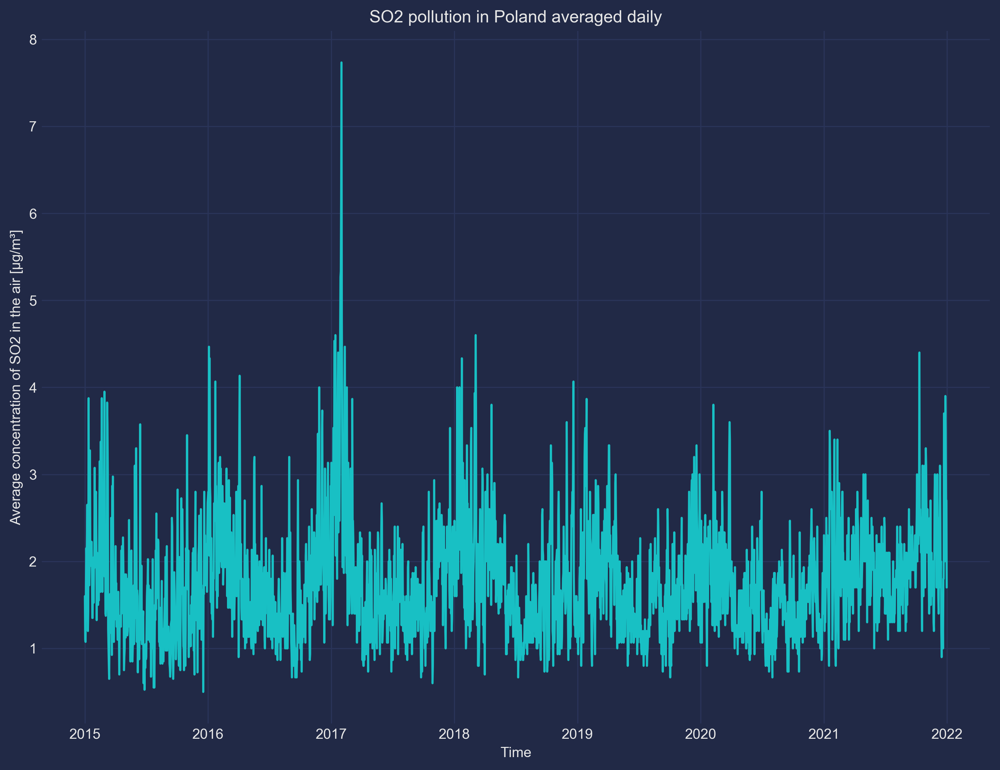

In [59]:
visualize.plot_timeline_of_pollution(df_g['daily'], 'SO2', 'daily')

## Monthly averages plot

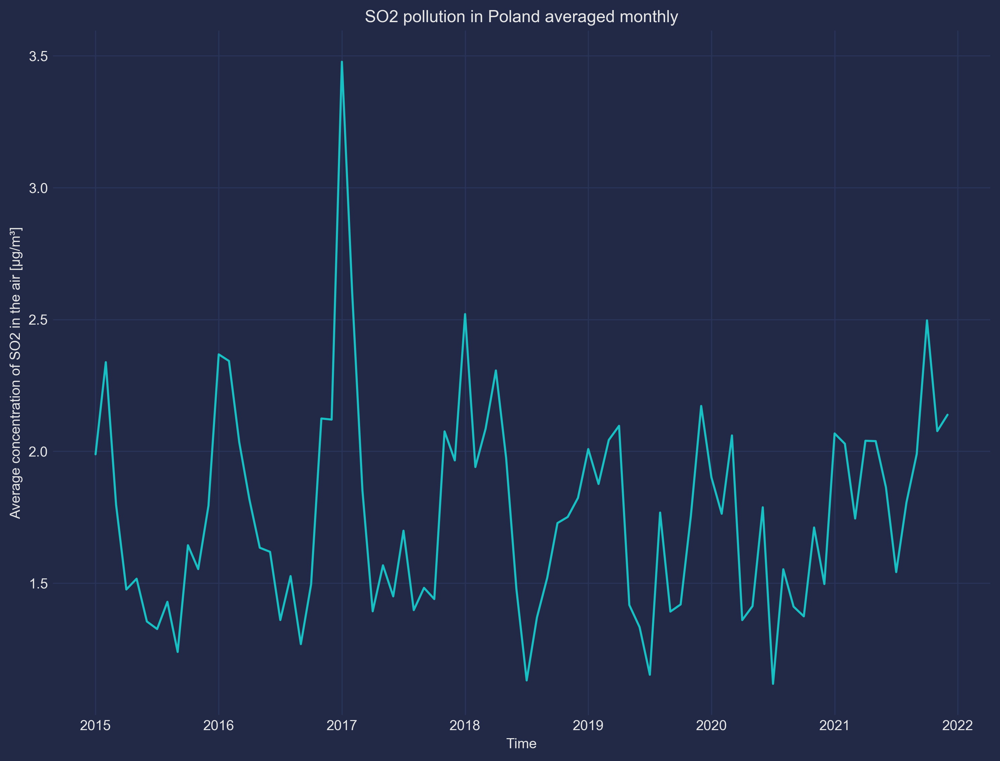

In [60]:
visualize.plot_timeline_of_pollution(df_g['monthly'], 'SO2', 'monthly')

## Weekly averages plot

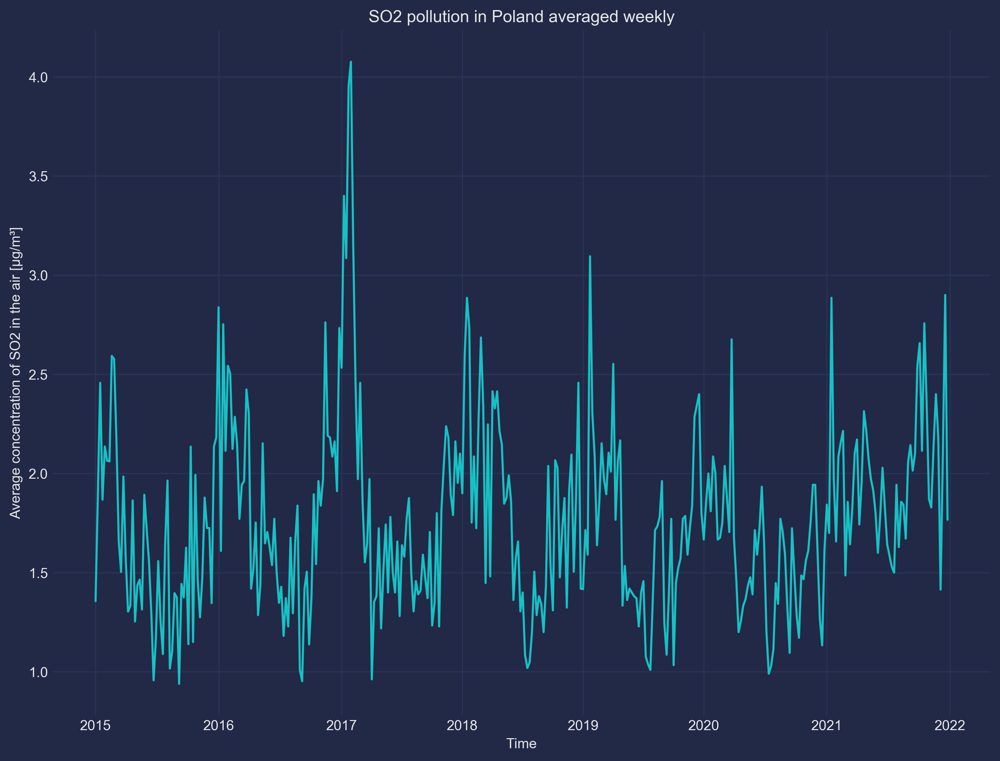

In [61]:
visualize.plot_timeline_of_pollution(df_g['weekly'], 'SO2', 'weekly')

## Decomposition of data into trend and seasonal changes

In [24]:
decomposition = {granularity: seasonal_decompose(df_g[granularity].measurement, model='add', period=utils.get_period_length(granularity)) 
                for granularity in ['daily', 'weekly', 'monthly']}

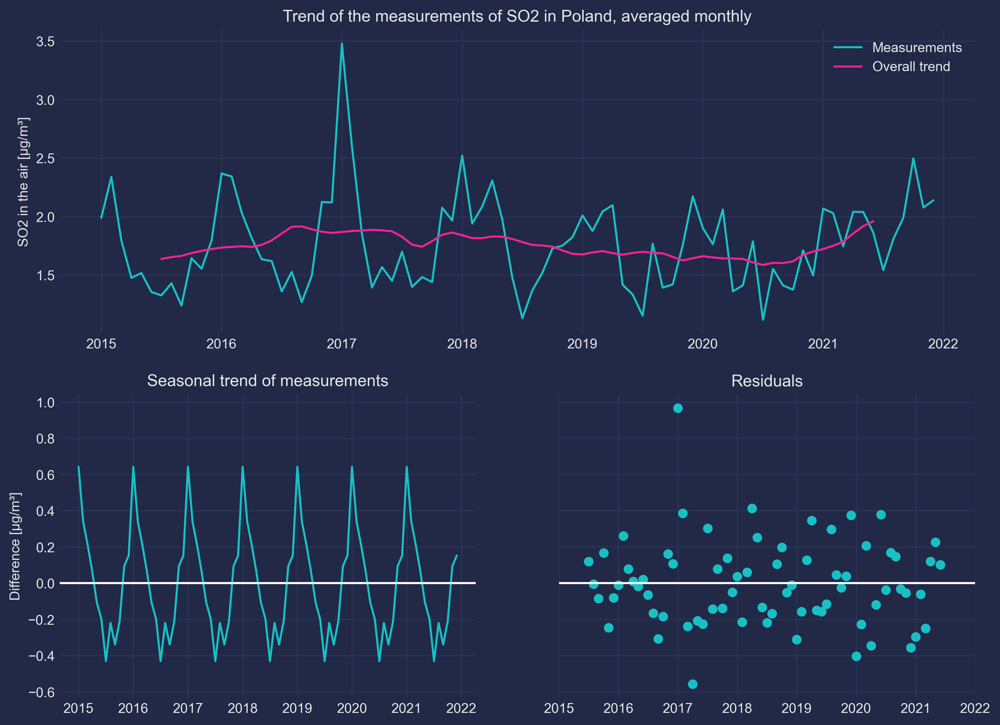

In [62]:
visualize.plot_decomposition_of_pollution(decomposition['monthly'], df_g['monthly'], 'SO2', 'monthly')

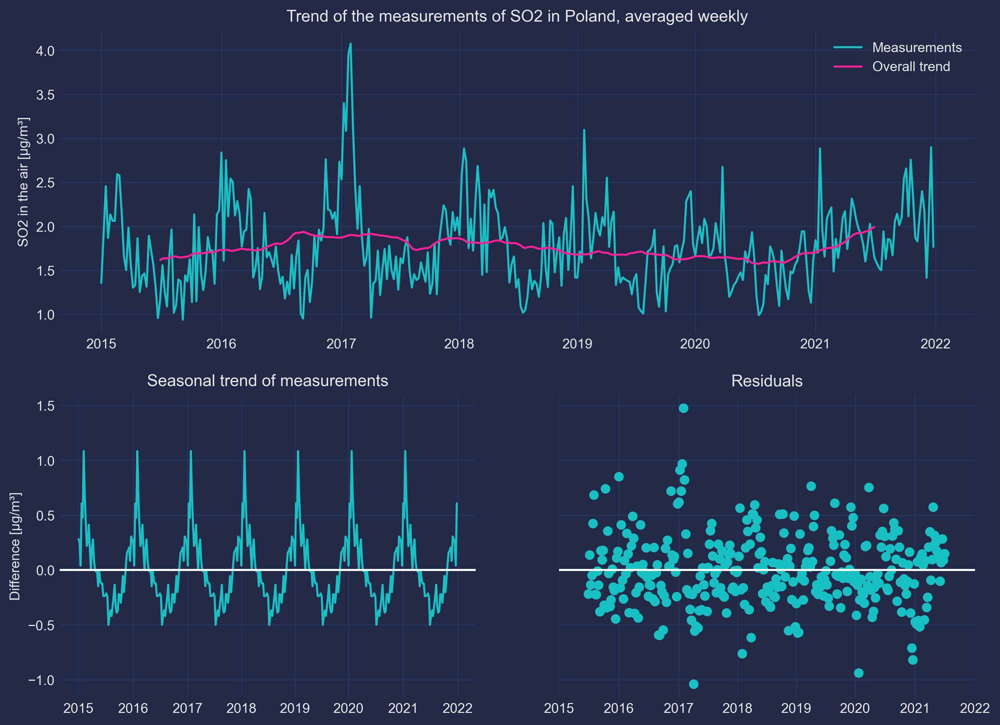

In [63]:
visualize.plot_decomposition_of_pollution(decomposition['weekly'], df_g['weekly'], 'SO2', 'weekly')

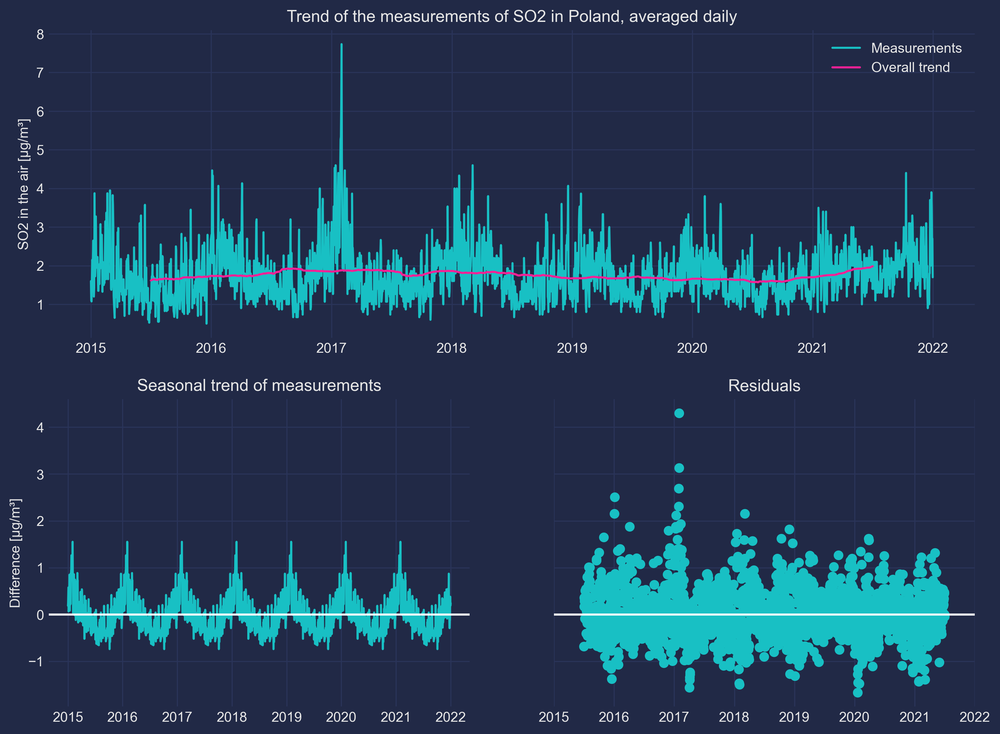

In [64]:
visualize.plot_decomposition_of_pollution(decomposition['daily'], df_g['daily'], 'SO2', 'daily')

## Creating ARIMA model for predicting 2020 and 2021

In [47]:
models_results = dict()

In [44]:
models_results['monthly_SO2'] = utils.unpack_to_dict(['model', 'df_train', 'df_test'], model.auto_model(df, 'monthly'))

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=32.199, Time=0.62 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=69.295, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=34.380, Time=0.63 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=39.837, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=243.424, Time=0.01 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=33.651, Time=0.38 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=39.880, Time=0.60 sec
 ARIMA(2,0,2)(2,0,1)[12] intercept   : AIC=inf, Time=1.30 sec
 ARIMA(2,0,2)(1,0,2)[12] intercept   : AIC=33.979, Time=1.28 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=48.334, Time=0.18 sec
 ARIMA(2,0,2)(0,0,2)[12] intercept   : AIC=33.638, Time=0.98 sec
 ARIMA(2,0,2)(2,0,0)[12] intercept   : AIC=32.200, Time=1.12 sec
 ARIMA(2,0,2)(2,0,2)[12] intercept   : AIC=inf, Time=1.57 sec
 ARIMA(1,0,2)(1,0,1)[12] intercept   : AIC=33.538, Time=0.60 sec
 ARIMA(2,0,1)(1,0,1)[12] intercept   : AIC=39.346, T

## ARIMA predictions for months

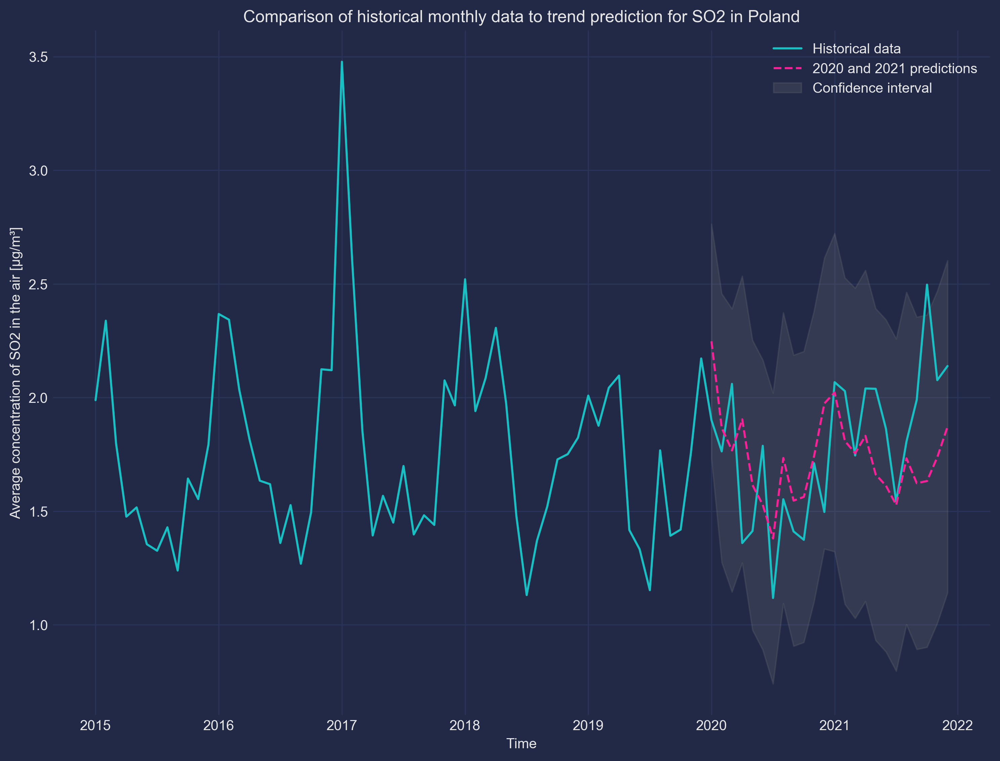

In [65]:
visualize.plot_historical_and_predictions(models['monthly_SO2'], 'SO2', 'monthly')

## Analysing heteroschedasticity (sic!) of the data

/home/rafaczd/Studia/sem10/SNaDV/project/venv/lib/python3.10/site-packages/pmdarima/utils/visualization.py:220: FutureWarning: the 'unbiased'' keyword is deprecated, use 'adjusted' instead.
  res = tsaplots.plot_acf(


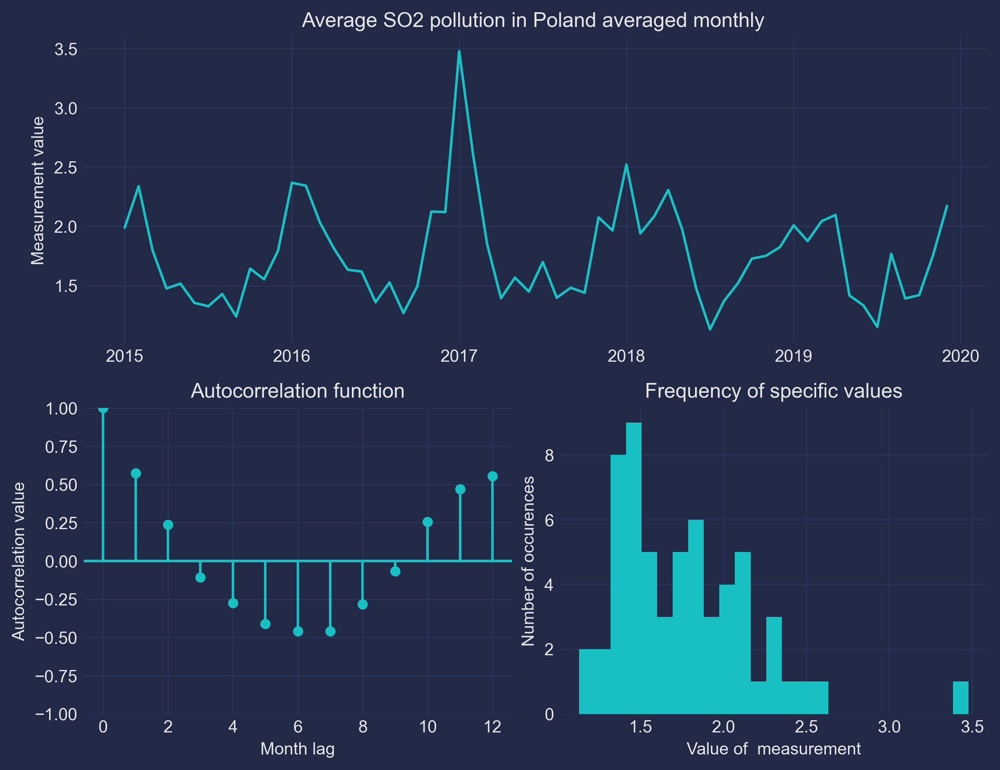

In [149]:
visualize.plot_acf_and_frequency(df_s['monthly']['train'], 'SO2', 'monthly')

/home/rafaczd/Studia/sem10/SNaDV/project/venv/lib/python3.10/site-packages/pmdarima/utils/visualization.py:220: FutureWarning: the 'unbiased'' keyword is deprecated, use 'adjusted' instead.
  res = tsaplots.plot_acf(


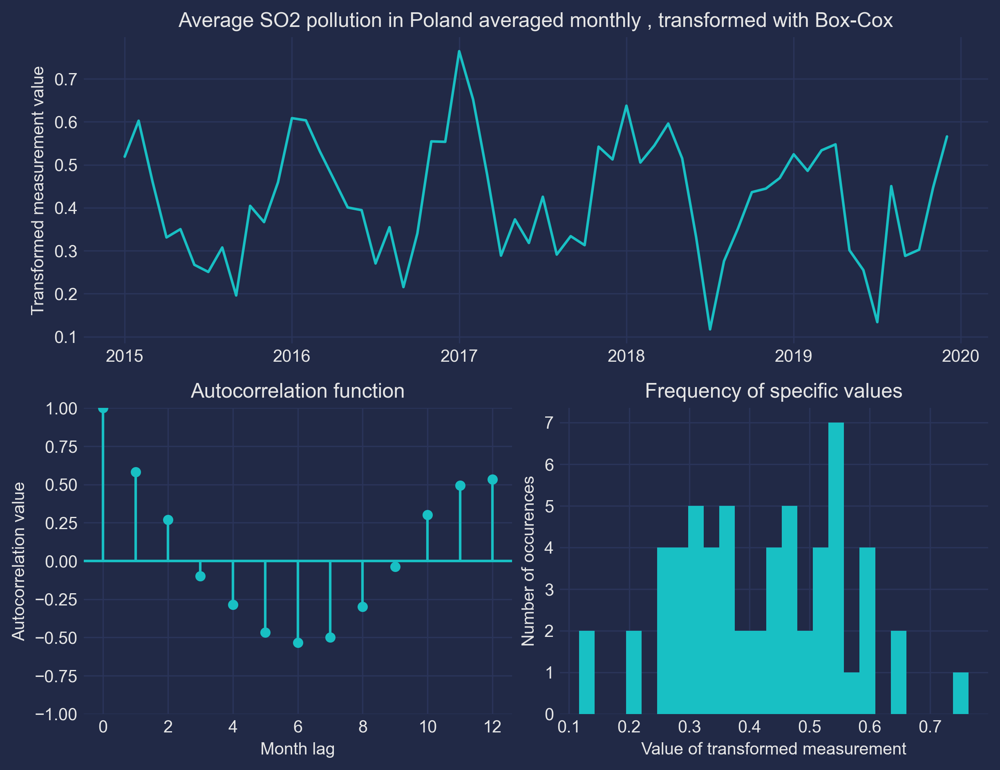

In [154]:
_, df_monthly_train_SO2_tf, _ = model.auto_transform(*model.train_test_split_on_year(df_g['monthly']))
visualize.plot_acf_and_frequency(df_monthly_train_SO2_tf, 'SO2', 'monthly', transformed=True)

In [144]:
model_results['monthly_SO2_tranformed'] = utils.unpack_to_dict(['model', 'df_train', 'df_test'], model.auto_model(df, 'monthly', True))

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=-101.229, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-65.812, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-98.016, Time=0.45 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-91.601, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=73.895, Time=0.01 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=-98.044, Time=0.59 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(2,0,2)(2,0,1)[12] intercept   : AIC=-101.071, Time=1.74 sec
 ARIMA(2,0,2)(1,0,2)[12] intercept   : AIC=-100.582, Time=1.22 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=-88.632, Time=0.16 sec
 ARIMA(2,0,2)(0,0,2)[12] intercept   : AIC=-97.363, Time=1.02 sec
 ARIMA(2,0,2)(2,0,0)[12] intercept   : AIC=-98.576, Time=1.45 sec
 ARIMA(2,0,2)(2,0,2)[12] intercept   : AIC=-99.964, Time=2.38 sec
 ARIMA(1,0,2)(1,0,1)[12] intercept   : AIC=-101.603, Time=1.77 sec
 ARIMA(1,0,2)(0,0,1)[12] intercept

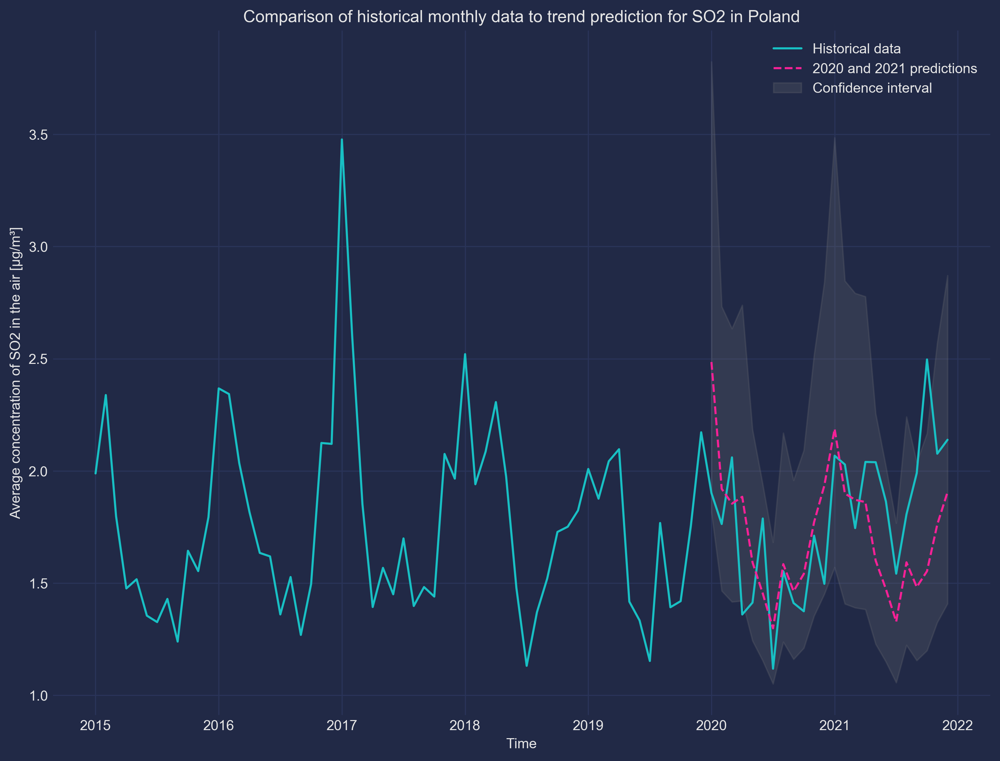

In [148]:
visualize.plot_historical_and_predictions(model_results['monthly_SO2_tranformed'], 'SO2', 'monthly')

## Building model for weekly averages

/home/rafaczd/Studia/sem10/SNaDV/project/venv/lib/python3.10/site-packages/pmdarima/utils/visualization.py:220: FutureWarning: the 'unbiased'' keyword is deprecated, use 'adjusted' instead.
  res = tsaplots.plot_acf(


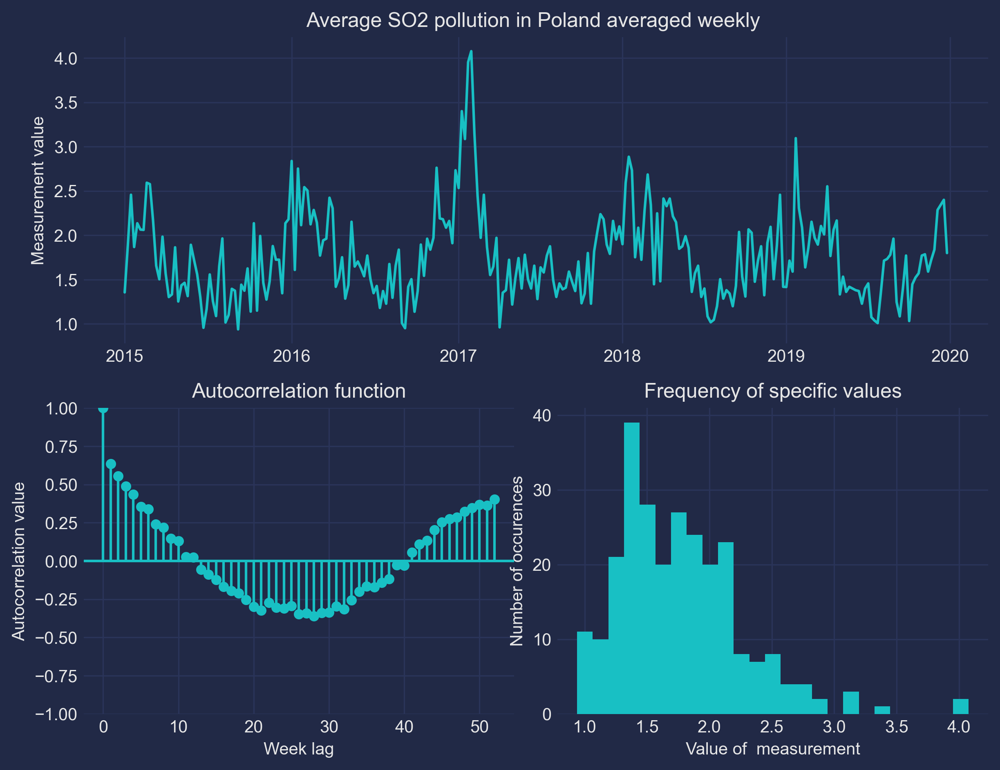

In [158]:
_, df_weekly_train_SO2_tf, _ = model.auto_transform(*model.train_test_split_on_year(df_g['weekly']))
visualize.plot_acf_and_frequency(df_weekly_train_SO2_tf, 'SO2', 'weekly', transformed=False)

/home/rafaczd/Studia/sem10/SNaDV/project/venv/lib/python3.10/site-packages/pmdarima/utils/visualization.py:220: FutureWarning: the 'unbiased'' keyword is deprecated, use 'adjusted' instead.
  res = tsaplots.plot_acf(


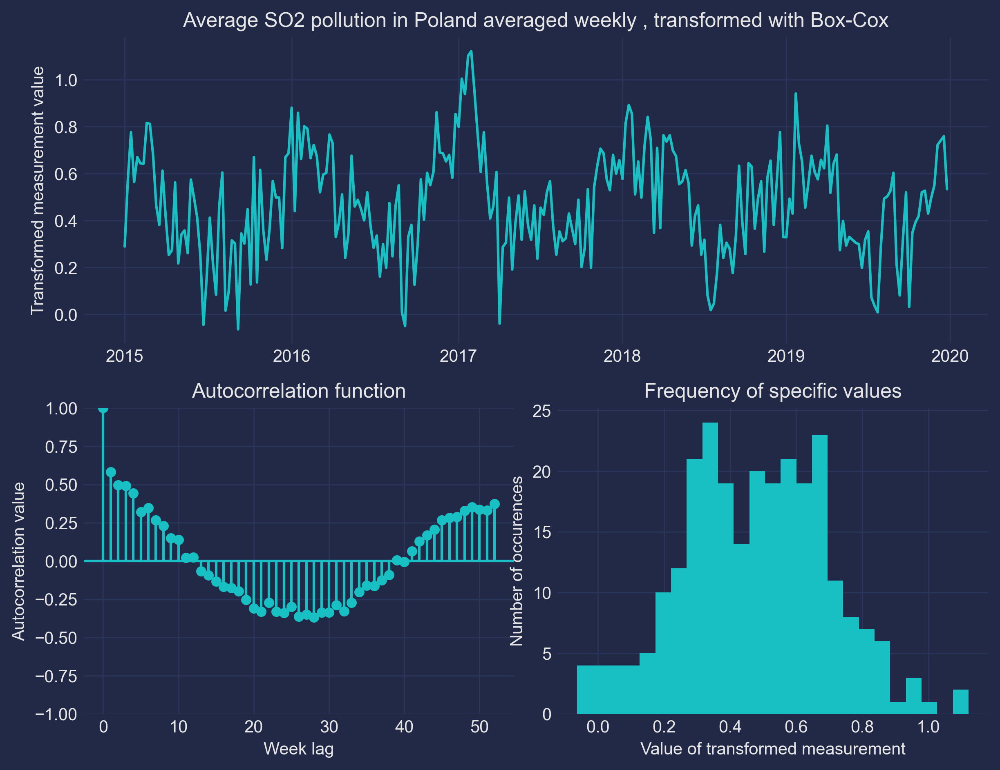

In [159]:
visualize.plot_acf_and_frequency(df_weekly_train_SO2_tf, 'SO2', 'weekly', transformed=True)

In [176]:
_, df_weekly_train_SO2_tf, df_weekly_test_SO2_tf = model.auto_transform(*model.train_test_split_on_year(df_g['weekly']))
decomposition = seasonal_decompose(df_weekly_train_SO2_tf.measurement_transformed, model='add', period=52)

/home/rafaczd/Studia/sem10/SNaDV/project/venv/lib/python3.10/site-packages/pmdarima/utils/visualization.py:220: FutureWarning: the 'unbiased'' keyword is deprecated, use 'adjusted' instead.
  res = tsaplots.plot_acf(


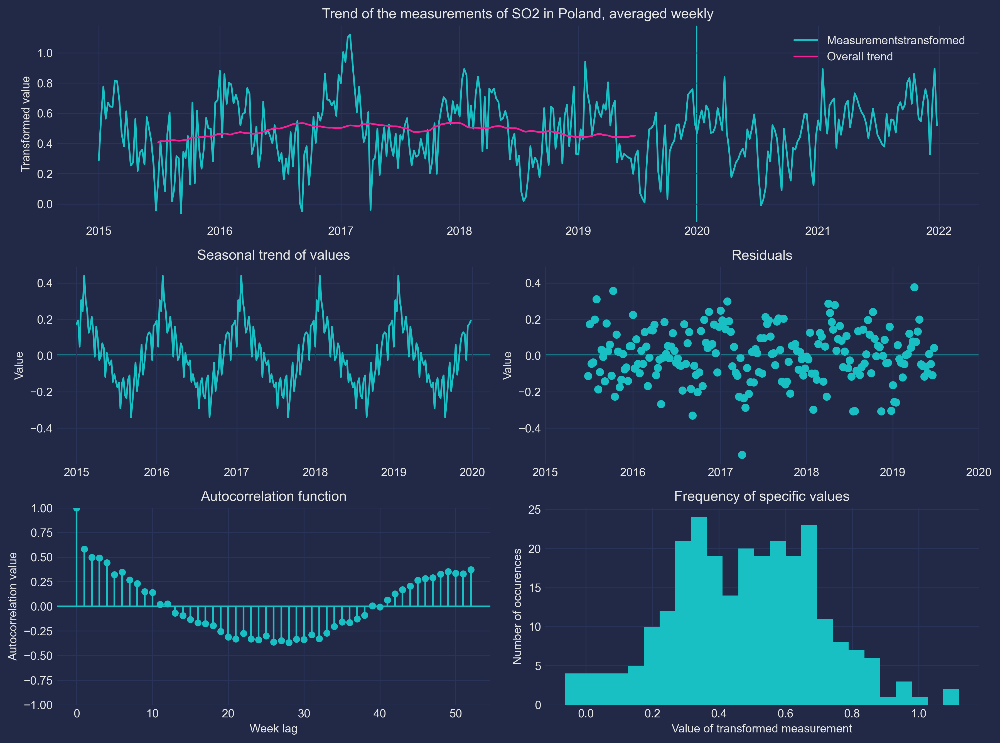

In [219]:
visualize.plot_full_pre_model_analysis(df_weekly_train_SO2_tf, df_weekly_test_SO2_tf, decomposition, 'SO2', 'weekly', True)

In [206]:
model_results['weekly_SO2_transformed'] = utils.unpack_to_dict(['model', 'df_train', 'df_test'], model.auto_model(df, 'weekly', transform=True))

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[52] intercept   : AIC=inf, Time=17.19 sec
 ARIMA(0,0,0)(0,0,0)[52] intercept   : AIC=-37.640, Time=0.10 sec
 ARIMA(1,0,0)(1,0,0)[52] intercept   : AIC=-148.960, Time=9.38 sec
 ARIMA(0,0,1)(0,0,1)[52] intercept   : AIC=-117.614, Time=7.02 sec
 ARIMA(0,0,0)(0,0,0)[52]             : AIC=407.703, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[52] intercept   : AIC=-143.587, Time=0.12 sec
 ARIMA(1,0,0)(2,0,0)[52] intercept   : AIC=-150.632, Time=44.49 sec
 ARIMA(1,0,0)(2,0,1)[52] intercept   : AIC=-148.635, Time=62.08 sec
 ARIMA(1,0,0)(1,0,1)[52] intercept   : AIC=-149.155, Time=13.26 sec
 ARIMA(0,0,0)(2,0,0)[52] intercept   : AIC=inf, Time=32.53 sec
 ARIMA(2,0,0)(2,0,0)[52] intercept   : AIC=-161.056, Time=47.67 sec
 ARIMA(2,0,0)(1,0,0)[52] intercept   : AIC=-160.884, Time=13.52 sec
 ARIMA(2,0,0)(2,0,1)[52] intercept   : AIC=-159.105, Time=80.89 sec
 ARIMA(2,0,0)(1,0,1)[52] intercept   : AIC=-158.839, Time=19.05 sec
 ARIMA(3,0,0)(2,0,0)[5

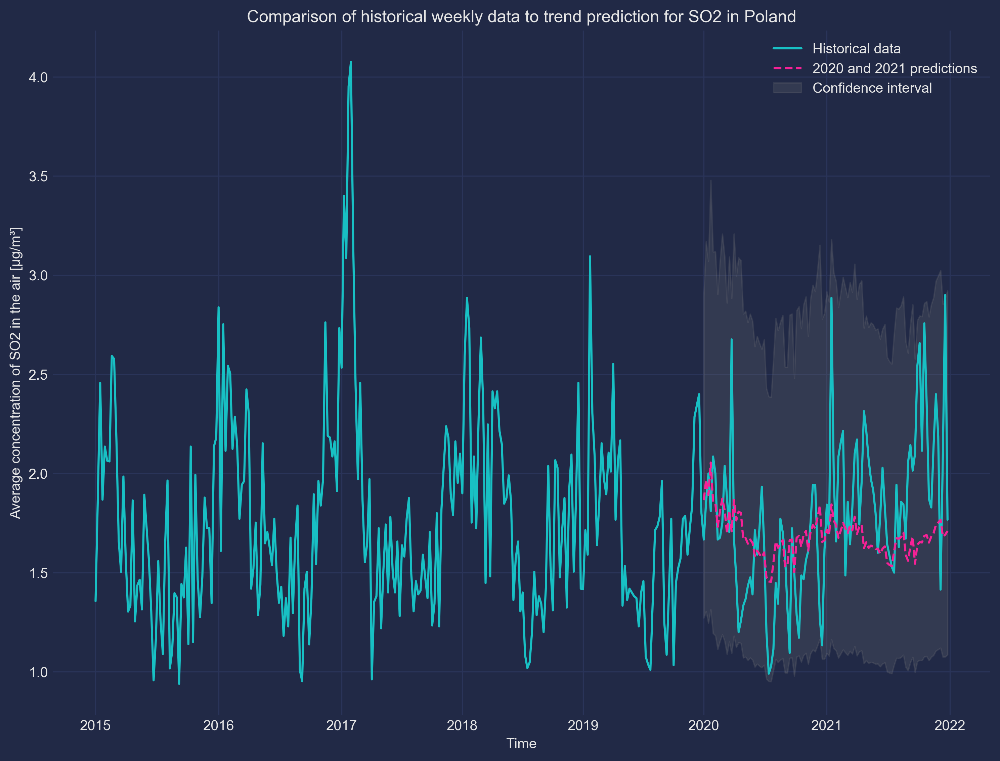

In [207]:
visualize.plot_historical_and_predictions(model_results['weekly_SO2_transformed'], 'SO2', 'weekly')

## Other pollution type

In [230]:
df_pm10 = read.query_data_range(years=list(range(2015, 2022)), pollutants='PM10', expositions=24)

df_pm10_m = model.group_and_reindex(df_pm10, 'monthly')

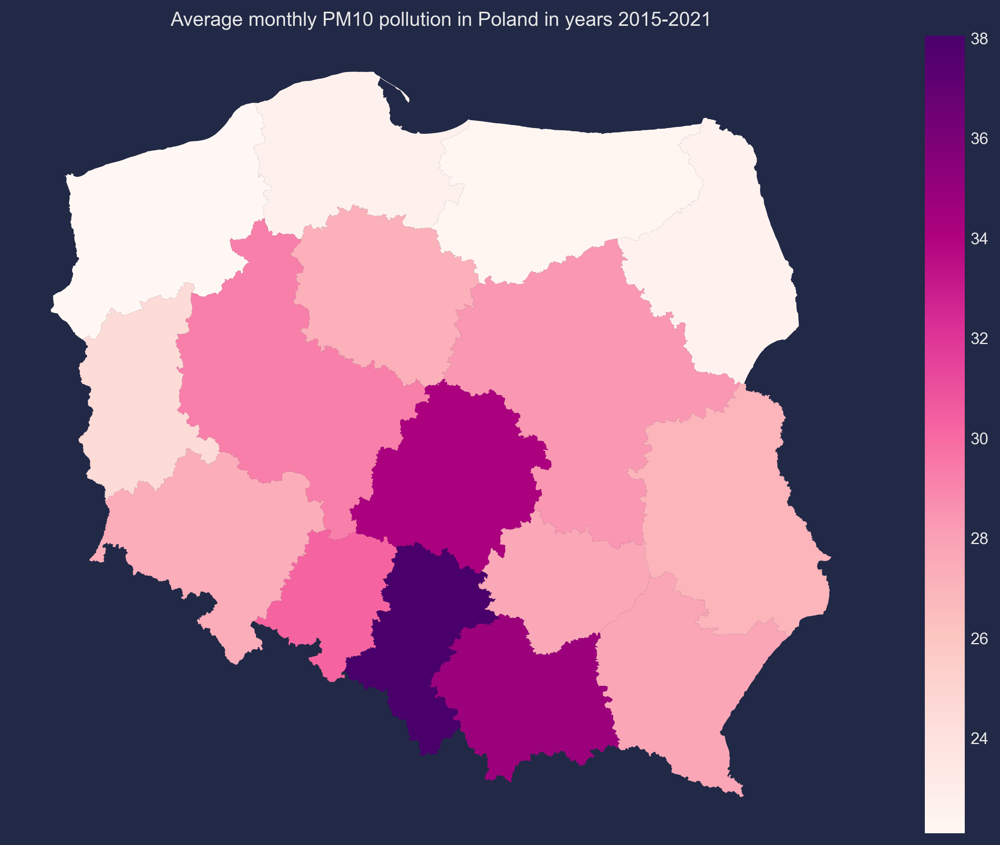

In [231]:
geo_data = read.get_geo_data()
avg_pollution = df_pm10 \
.groupby(['timestamp', 'region']) \
.agg(np.nanmean) \
.reset_index() \
.groupby('region') \
.mean()
geo_data = geo_data.join(avg_pollution, on='region')
visualize.plot_map_with_pollutions(geo_data, 'Average monthly PM10 pollution in Poland in years 2015-2021')

In [232]:
df_pm10_d = model.group_and_reindex(df_pm10, 'daily')

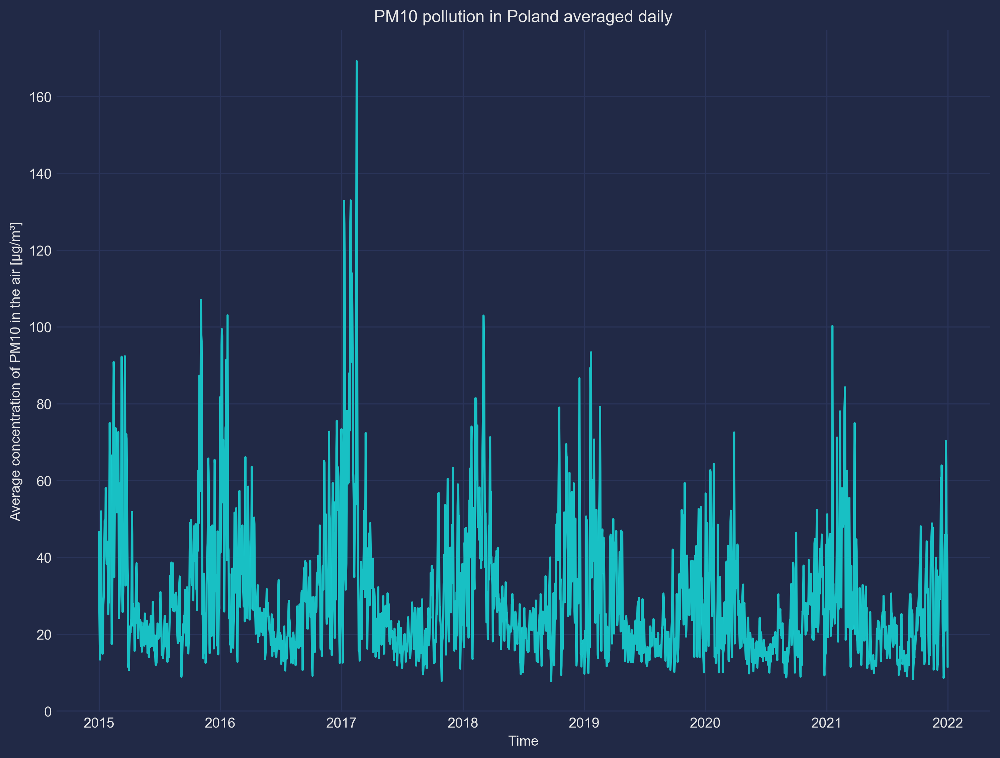

In [233]:
visualize.plot_timeline_of_pollution(df_pm10_d, 'PM10', 'daily')

In [234]:
_, df_weekly_train_pm10_tf, df_weekly_test_pm10_tf = model.auto_transform(*model.train_test_split_on_year(df_pm10_m))
decomposition = seasonal_decompose(df_weekly_train_pm10_tf.measurement_transformed, model='add', period=12)

/home/rafaczd/Studia/sem10/SNaDV/project/venv/lib/python3.10/site-packages/pmdarima/utils/visualization.py:220: FutureWarning: the 'unbiased'' keyword is deprecated, use 'adjusted' instead.
  res = tsaplots.plot_acf(


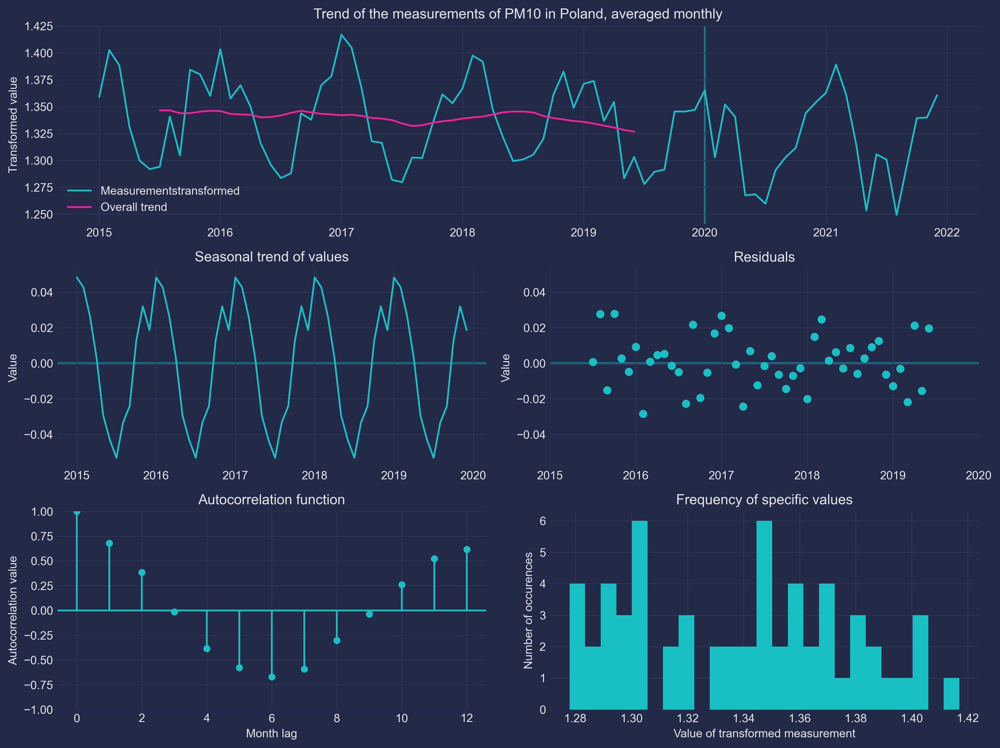

In [235]:
visualize.plot_full_pre_model_analysis(df_weekly_train_pm10_tf, df_weekly_test_pm10_tf, decomposition, 'PM10', 'monthly', True)

In [236]:
model_results['pm10_monthly'] = utils.unpack_to_dict(['model', 'df_train', 'df_test'], model.auto_model(df_pm10, 'monthly', True))

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.10 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-218.280, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=207.337, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=-266.308, Time=0.54 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=-263.498, Time=1.32 sec
 ARIMA(0,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,0,0)(0,0,2)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(0,0,0)(2,0,2)[12] intercept   : AIC=-258.718, Time=1.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.59 sec
 AR

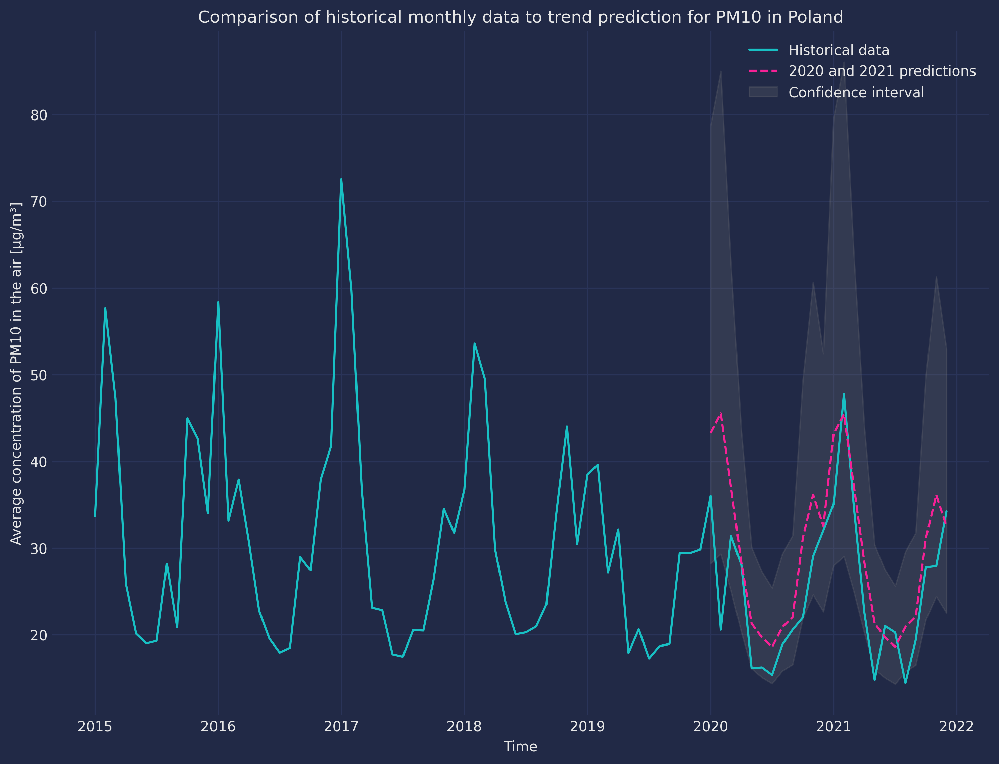

In [238]:
fig, ax = visualize.plot_historical_and_predictions(model_results['pm10_monthly'], 'PM10', 'monthly', show=False)
plt.show()

## Other pollution type splitted between different regions

In [239]:
selected_regions = ['MAZOWIECKIE', 'SLASKIE', 'KUJAWSKO-POMORSKIE']

selected_regions_labels = {
    'MAZOWIECKIE': 'Mazowieckie (capital area)', 
    'SLASKIE': 'Śląskie (industrial area)', 
    'KUJAWSKO-POMORSKIE': 'Kujawsko-Pomorskie (green area)'  
}

df_pm10_reg = {region: df_pm10[df_pm10.region == region] for region in selected_regions}
df_pm10_reg_m = {region: model.group_and_reindex(df_pm10_reg[region], 'monthly')  for region in selected_regions}

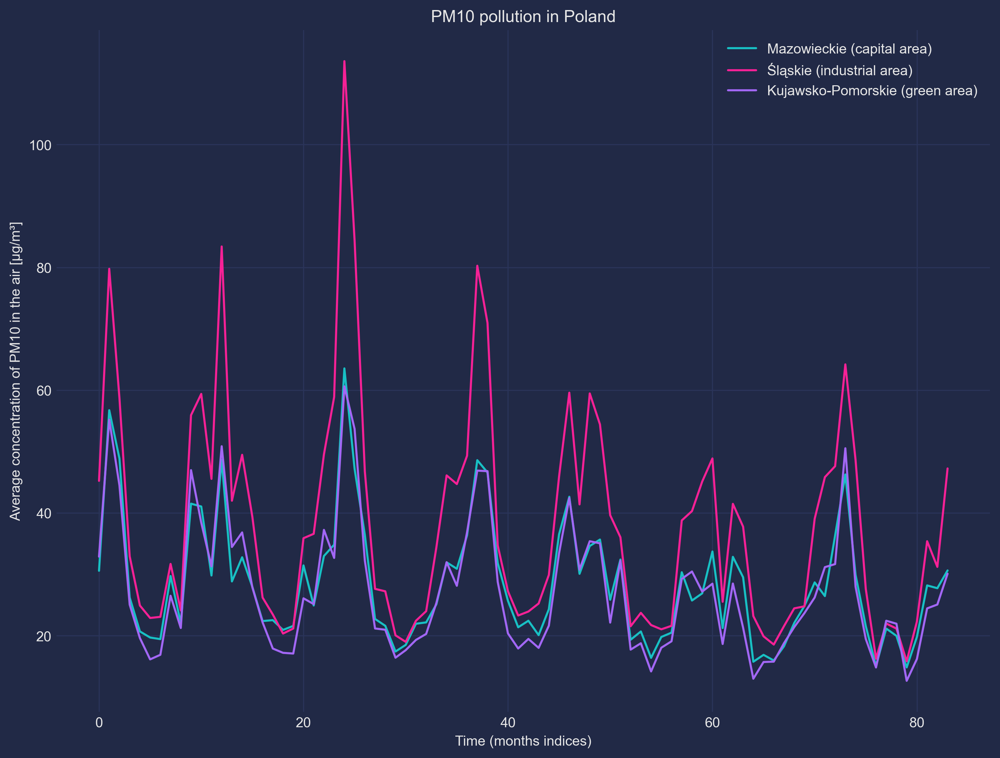

In [241]:
with plt.style.context(visualize.DEFAULT_THEME), plt.rc_context(visualize.DEFAULT_RC_PARAMS):
    fig, ax = plt.subplots()

    for region in selected_regions:
        ax.plot(df_pm10_reg_m[region].measurement)

    ax.set_title('PM10 pollution in Poland')
    ax.set_xlabel('Time (months indices)')
    ax.set_ylabel('Average concentration of PM10 in the air [μg/m³]')
    ax.legend([selected_regions_labels[region] for region in selected_regions])
    
    plt.show()

In [242]:
results = {region: model.auto_model(df_pm10_reg[region], 'monthly', transform=True) for region in selected_regions}

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.15 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-289.632, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-310.543, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=190.254, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=-306.283, Time=0.10 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=-306.012, Time=0.78 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=-313.459, Time=0.86 sec
 ARIMA(0,0,1)(1,0,2)[12] intercept   : AIC=-314.816, Time=1.36 sec
 ARIMA(0,0,1)(2,0,2)[12] intercept   : AIC=-311.165, Time=1.50 sec
 ARIMA(0,0,1)(2,0,1)[12] intercept   : AIC=inf, Time=3.03 sec
 ARIMA(0,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=1.18 sec
 ARIMA(1,0,1)(1,0,2)[12] intercept   : AIC=-315.618, Time=2.07 sec
 ARIMA(1,0,1)(0,0,2)[12] intercept   : AIC=-315.791, Time=0.75 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : A

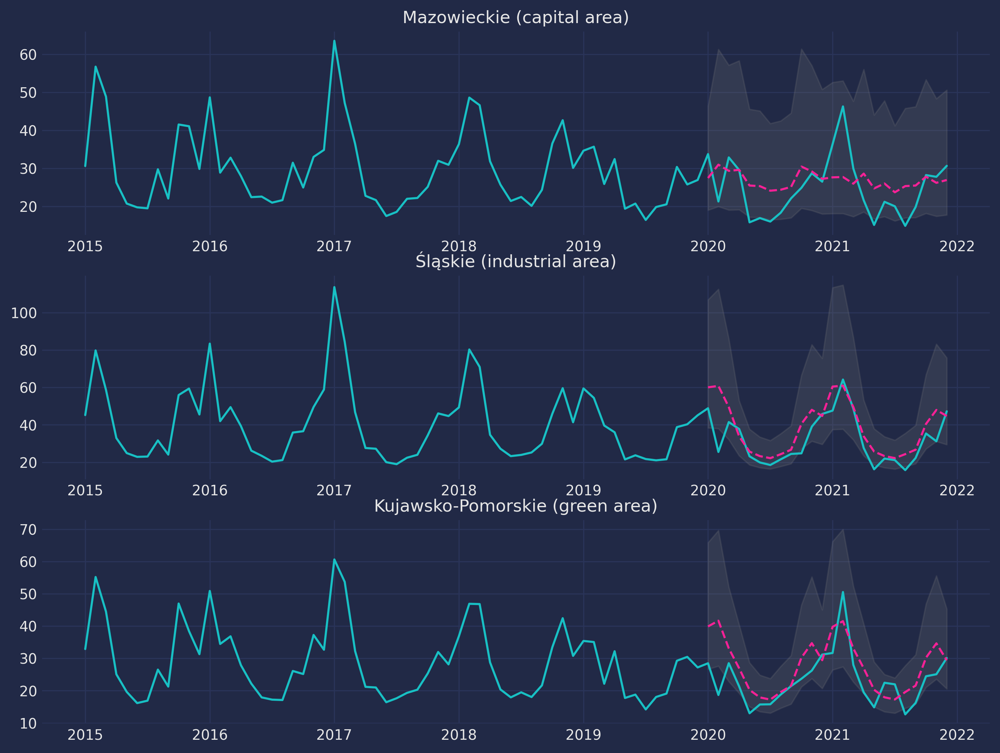

In [259]:
with plt.style.context(visualize.DEFAULT_THEME), plt.rc_context(visualize.DEFAULT_RC_PARAMS):
    fig, axs = plt.subplots(3, 1)
    
    for ax, region in zip(axs, selected_regions):
        data_full = pd.concat([results[region][1][['measurement', 'year']], results[region][2][['measurement', 'year']]])
        data_test = results[region][2]

        ax.plot(data_full.measurement)
        ax.plot(data_test.prediction, linestyle='dashed')
        ax.fill_between(data_test.index, data_test.lower_confidence, data_test.upper_confidence,
                       color='gray', alpha=0.2)
        ax.set_title(selected_regions_labels[region])
        ax.set_xticks(*utils.generate_ticks(data_full))